In [2]:
# uncomment this if you have cuda and want to specify the device
#import os
#os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [1]:
import numpy as np
import cv2
import glob
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import tqdm
import seaborn as sns
import torchvision
import torch
import PIL
from PIL import Image
import json

def show_image(image, figsize=(16, 9), reverse=True):
    plt.figure(figsize=figsize)
    if reverse:
        plt.imshow(image[...,::-1])
    else:
        plt.imshow(image)
    plt.axis('off')
    plt.show()

def save_to_json(filename, data):
    with open(filename, 'w') as f:
        return json.dump(data, f)
    
def load_from_json(filename):
    with open(filename, 'r') as f:
        return json.load(f)

# Load COCO info

Useful links:
http://cocodataset.org/#home

In [2]:
coco_id_to_name = load_from_json("coco_id_to_name.json")

In [3]:
coco_id_to_name = {int(key): value for key, value in coco_id_to_name.items()}

In [4]:
len(coco_id_to_name)

80

In [5]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Sample run

In [6]:
file = 'detection_examples/mrs_maisel.jpg'

https://github.com/pytorch/vision/blob/c732dfe2a4b1c861d8d1fedd7999f473f8cd3142/torchvision/models/detection/faster_rcnn.py#L24

In [7]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, progress=True,
                            num_classes=91, pretrained_backbone=True)

In [8]:
from torchvision import transforms

to_tensor = transforms.ToTensor()

def val_transform(img):
    img_tensor = to_tensor(img)
    return img_tensor.unsqueeze(0)

def visualize_prediction(file, model, device='cpu', verbose=True, thresh=0.0, n_colors=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size bs=1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    for i in range(len(prediction['boxes'])):
        x1, x2, x3, x4 = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = coco_id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x1, x2), (x3, x4), np.array(color) * 255, 2)
            cv2.putText(image, name, (x1, x2-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

In [9]:
file

'detection_examples/mrs_maisel.jpg'

In [10]:
img = Image.open(file)

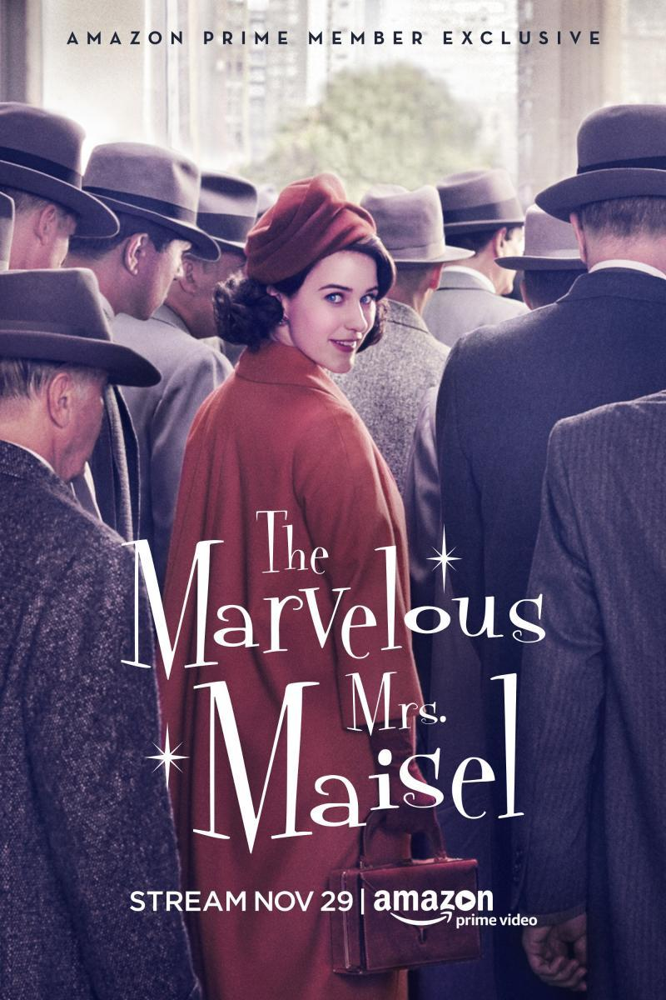

In [11]:
img

Class: person, Confidence: 0.9957577586174011
Class: person, Confidence: 0.9785687923431396
Class: person, Confidence: 0.9711196422576904
Class: person, Confidence: 0.9520586729049683
Class: person, Confidence: 0.9485946297645569
Class: person, Confidence: 0.9434379935264587
Class: person, Confidence: 0.9264218211174011
Class: person, Confidence: 0.9073954820632935
Class: person, Confidence: 0.7227161526679993
Class: person, Confidence: 0.6452590823173523
Class: person, Confidence: 0.6441426873207092
Class: tie, Confidence: 0.6039673089981079
Class: chair, Confidence: 0.4041597247123718
Class: person, Confidence: 0.4040912687778473
Class: person, Confidence: 0.4021972715854645
Class: person, Confidence: 0.36066606640815735
Class: person, Confidence: 0.3213827908039093
Class: person, Confidence: 0.3178982436656952
Class: person, Confidence: 0.3035103380680084
Class: person, Confidence: 0.28436481952667236
Class: chair, Confidence: 0.22806546092033386
Class: person, Confidence: 0.2193064

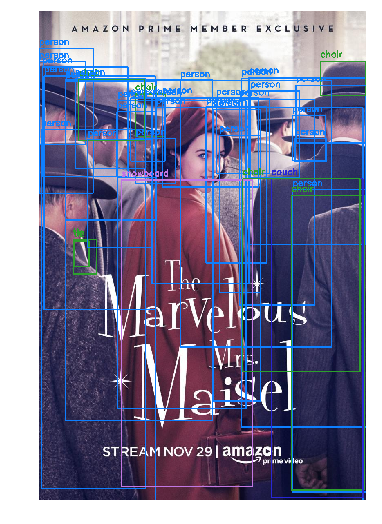

In [20]:
out = visualize_prediction(file, model, device='cpu')

Class: person, Confidence: 0.9957577586174011
Class: person, Confidence: 0.9785687923431396
Class: person, Confidence: 0.9711196422576904
Class: person, Confidence: 0.9520586729049683
Class: person, Confidence: 0.9485946297645569
Class: person, Confidence: 0.9434379935264587
Class: person, Confidence: 0.9264218211174011
Class: person, Confidence: 0.9073954820632935


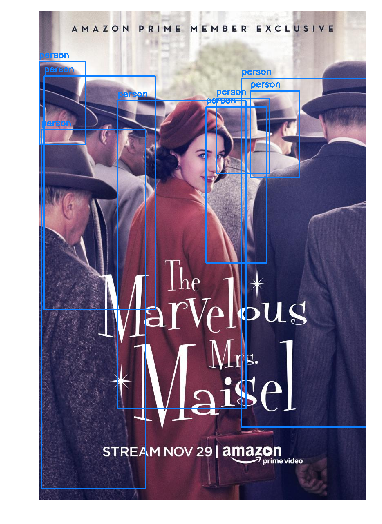

In [22]:
out = visualize_prediction(file, model, thresh=0.8)

# Еще один пример

In [23]:
file = 'detection_examples/junk_food.jpg'

Class: person, Confidence: 0.9768174290657043
Class: person, Confidence: 0.962204098701477
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556108117103577
Class: person, Confidence: 0.8266410827636719
Class: sandwich, Confidence: 0.8228065967559814
Class: hot dog, Confidence: 0.8058310747146606
Class: person, Confidence: 0.5006293654441833
Class: sandwich, Confidence: 0.4935187101364136
Class: person, Confidence: 0.48630720376968384
Class: bowl, Confidence: 0.447009414434433
Class: person, Confidence: 0.4429386556148529
Class: cake, Confidence: 0.2982228696346283
Class: sandwich, Confidence: 0.26901698112487793
Class: cup, Confidence: 0.2425873726606369
Class: person, Confidence: 0.22882653772830963
Class: dining table, Confidence: 0.2124510109424591
Class: cell phone, Confidence: 0.2023983597755432
Class: person, Confidence: 0.17625704407691956
Class: cell phone, Confidence: 0.17373178899288177
Class: sandwich, Confidence: 0.16645485162734985
Class: hot dog

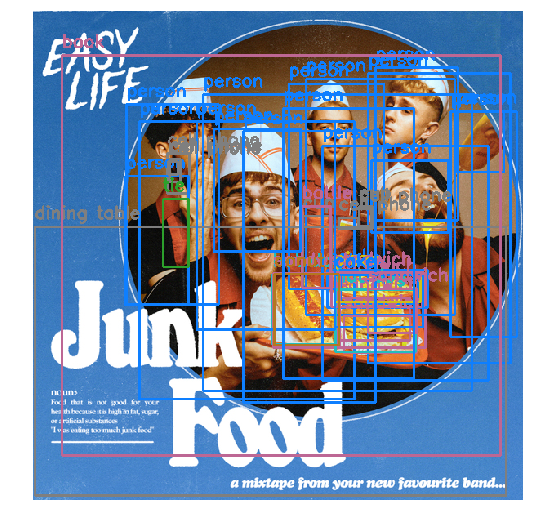

In [24]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9768174290657043
Class: person, Confidence: 0.962204098701477
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556108117103577
Class: person, Confidence: 0.8266410827636719
Class: sandwich, Confidence: 0.8228065967559814
Class: hot dog, Confidence: 0.8058310747146606


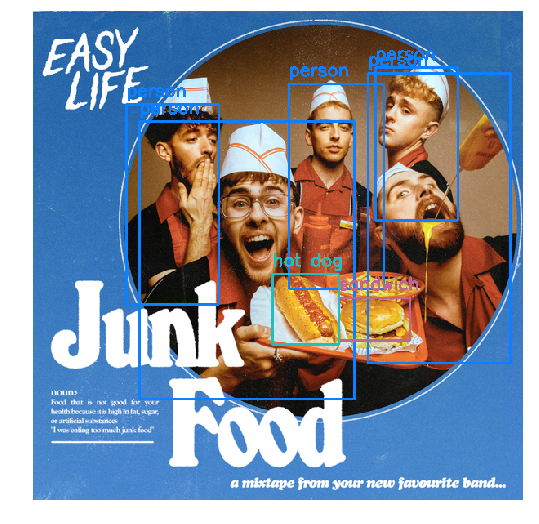

In [25]:
out = visualize_prediction(file, model, thresh=0.8)

Class: person, Confidence: 0.9768174290657043
Class: person, Confidence: 0.962204098701477
Class: person, Confidence: 0.9575529098510742
Class: person, Confidence: 0.9556108117103577
Class: person, Confidence: 0.8266410827636719
Class: sandwich, Confidence: 0.8228065967559814
Class: hot dog, Confidence: 0.8058310747146606
Class: person, Confidence: 0.5006293654441833
Class: sandwich, Confidence: 0.4935187101364136
Class: person, Confidence: 0.48630720376968384
Class: bowl, Confidence: 0.447009414434433
Class: person, Confidence: 0.4429386556148529


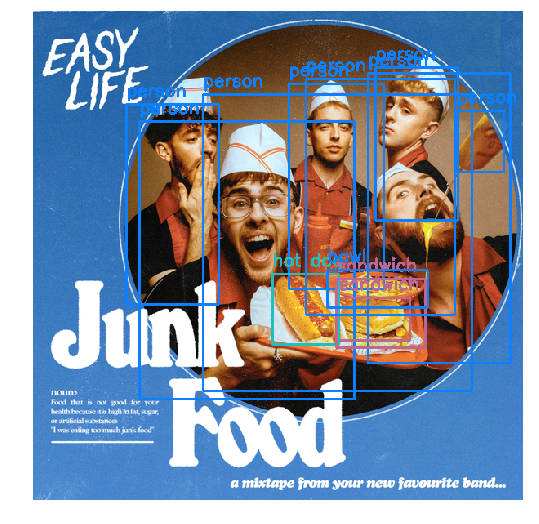

In [26]:
out = visualize_prediction(file, model, thresh=0.4)

In [27]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

## Моя картинка

In [28]:
file = 'detection_examples/my1.jpg'

Class: cat, Confidence: 0.8125396370887756


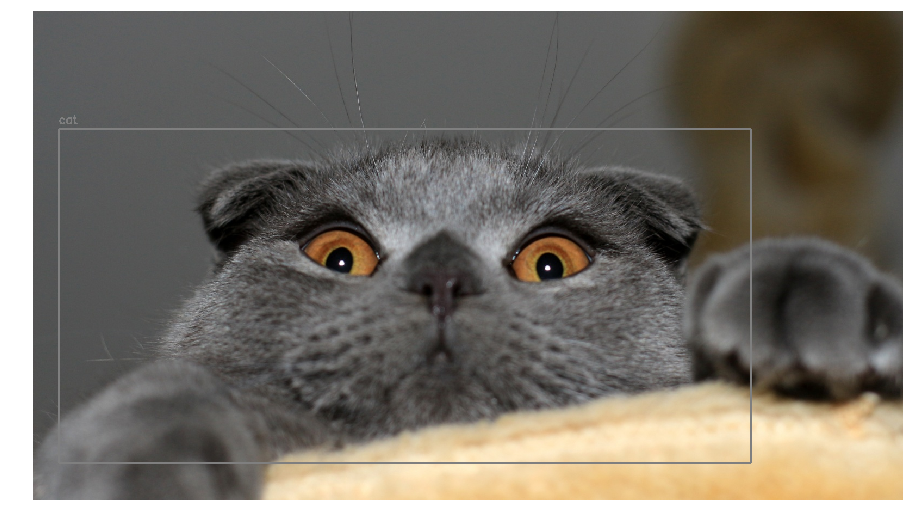

In [29]:
out = visualize_prediction(file, model, thresh=0.8)

In [36]:
file = 'detection_examples/my3.jpg'

Class: person, Confidence: 0.9844993948936462
Class: person, Confidence: 0.9806637763977051
Class: tennis racket, Confidence: 0.9791601300239563
Class: person, Confidence: 0.9789239764213562
Class: person, Confidence: 0.9735898375511169


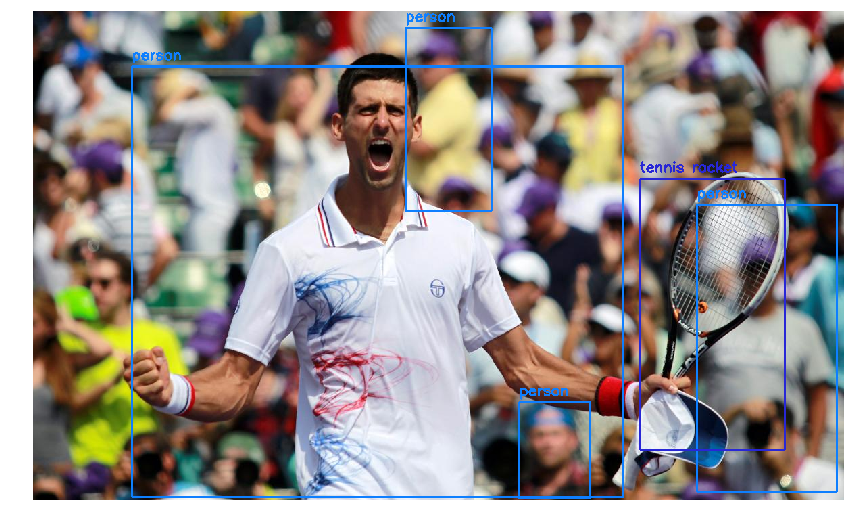

In [38]:
out = visualize_prediction(file, model, thresh=0.97)

In [41]:
file = 'detection_examples/my4.jpg'

Class: tennis racket, Confidence: 0.9909272193908691
Class: person, Confidence: 0.9795653820037842
Class: sports ball, Confidence: 0.685889482498169


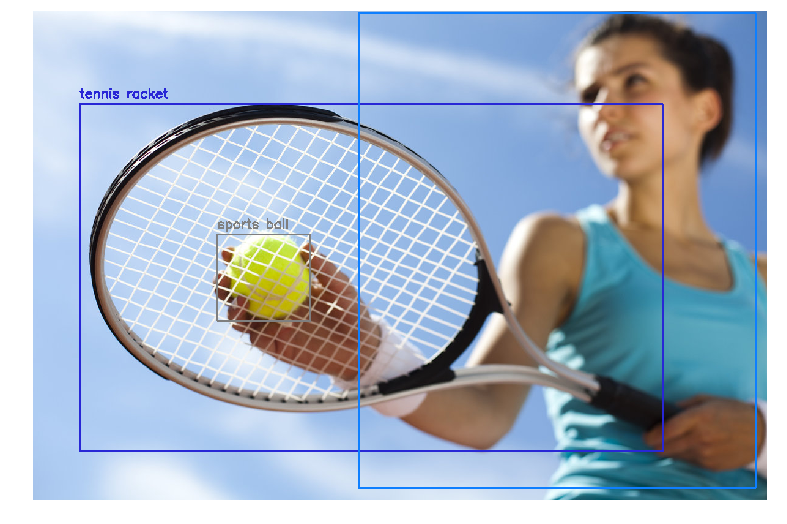

In [44]:
out = visualize_prediction(file, model, thresh=0.5)

# Давайте дообучимся на что-нибудь новое: номерные знаки

### Датасет Open images:
https://storage.googleapis.com/openimages/web/index.html

In [9]:
filename_to_bbox_train_dict = load_from_json('filename_to_bbox_train.json')

In [10]:
filename_to_bbox_val_dict = load_from_json('filename_to_bbox_val.json')

In [11]:
len(filename_to_bbox_train_dict), len(filename_to_bbox_val_dict)

(1313, 200)

In [12]:
def visualize_from_dataset(file, filename_to_bbox_dict):
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    for i in range(len(filename_to_bbox_dict[file])):
        x_min, x_max, y_min, y_max = filename_to_bbox_dict[file][i]
        x_min, y_min, x_max, y_max = int(x_min * w), int(y_min * h), int(x_max * w), int(y_max * h)
        image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    show_image(image)

In [13]:
train_filenames = list(filename_to_bbox_train_dict.keys())

In [17]:
filename_to_bbox_train_dict[train_filenames[0]]

[[0.445, 0.51375, 0.755833, 0.786667], [0.62375, 0.678125, 0.753333, 0.779167]]

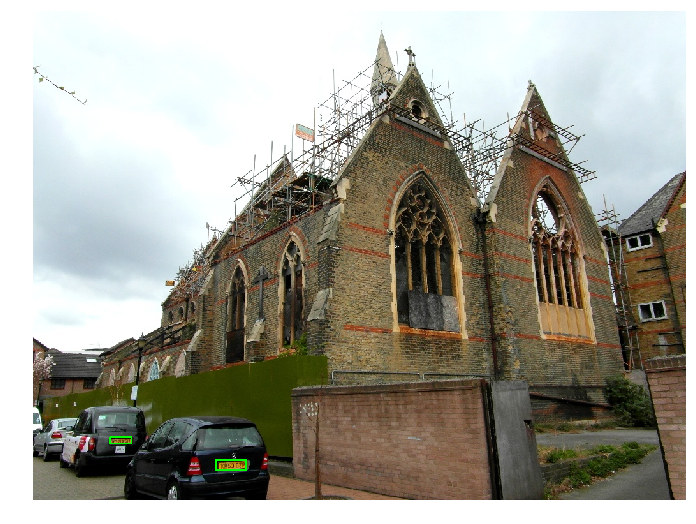

In [51]:
filename = np.random.choice(train_filenames)
visualize_from_dataset(filename, filename_to_bbox_train_dict)

In [52]:
val_filenames = list(filename_to_bbox_val_dict.keys())

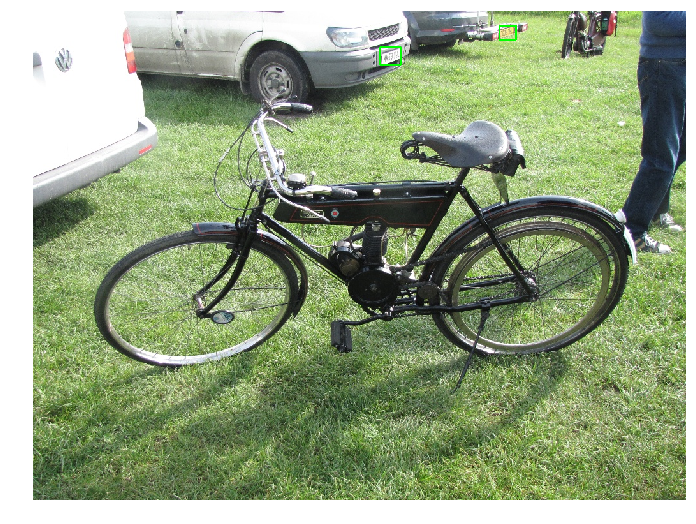

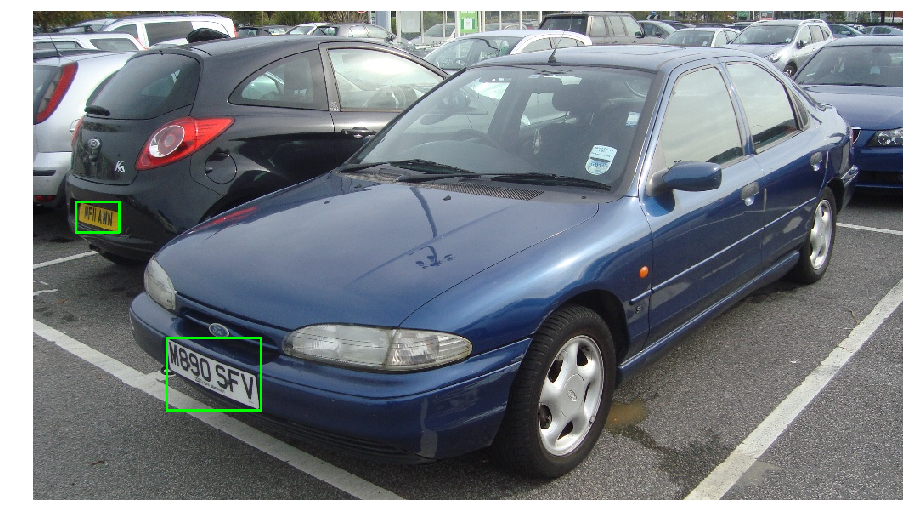

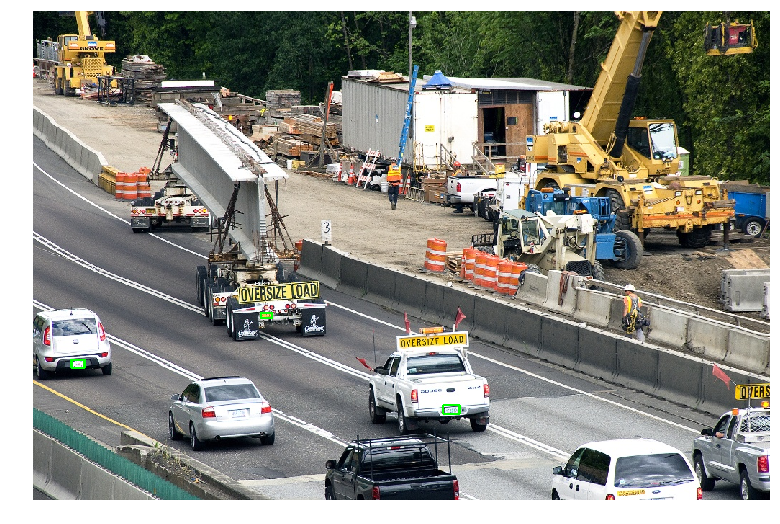

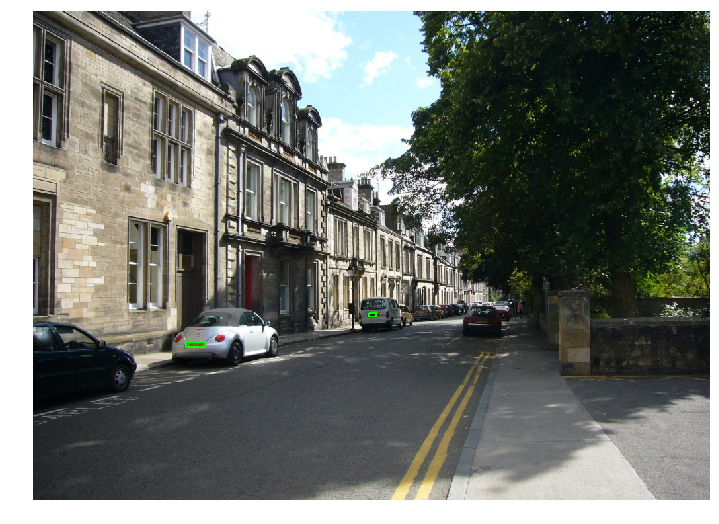

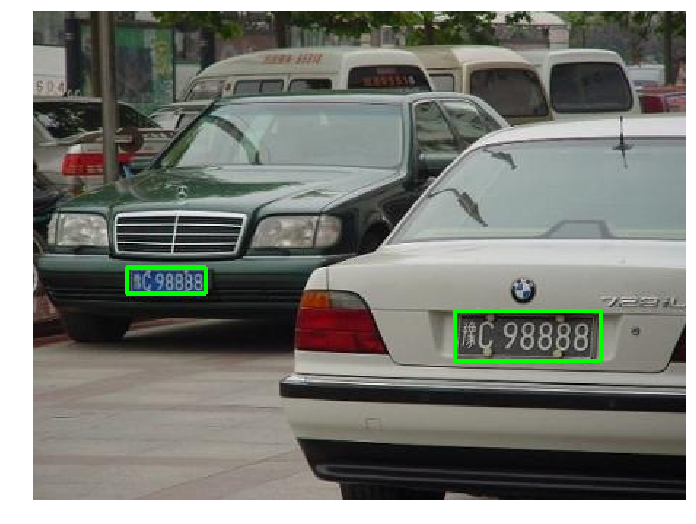

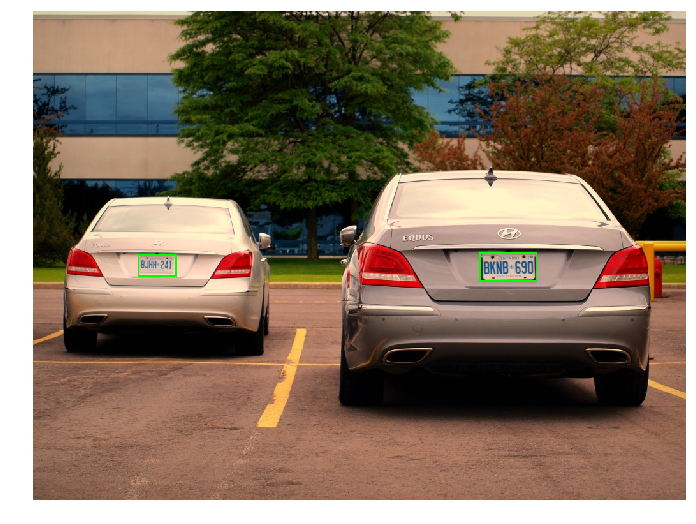

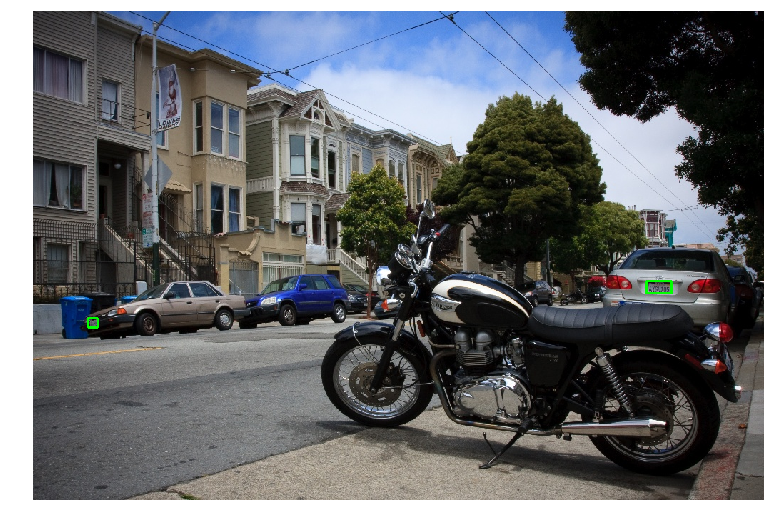

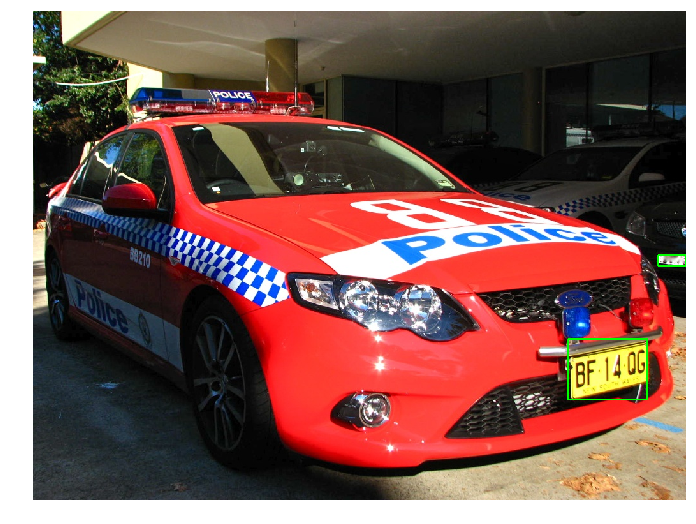

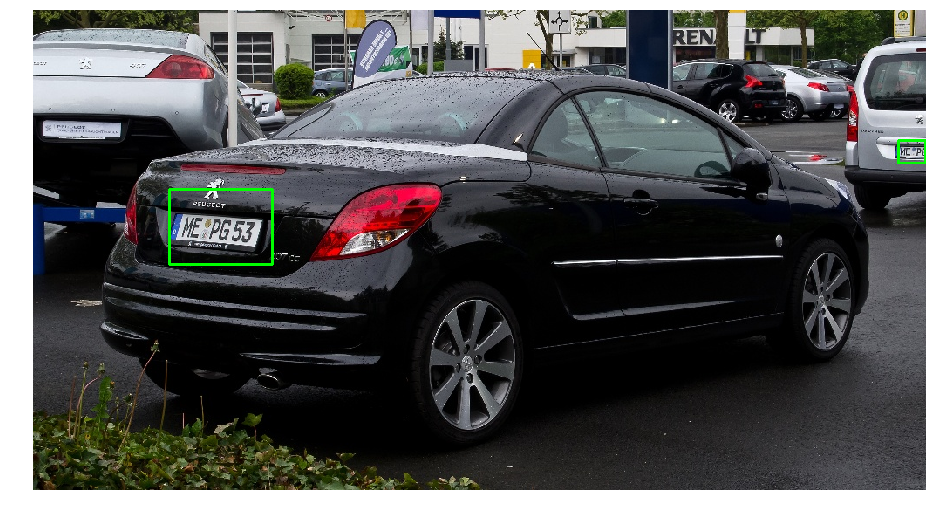

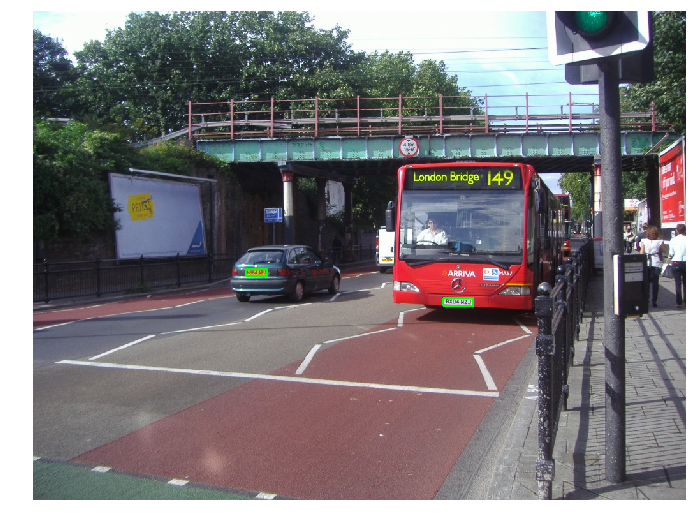

In [53]:
for filename in np.random.choice(val_filenames, 10):
    visualize_from_dataset(filename, filename_to_bbox_val_dict)

# Создадим класс датасета

In [14]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import json
from torchvision import transforms

class DetectionDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict_file, transforms=None):
        self.transforms = transforms
        
        with open(data_dict_file, 'r') as f:
            self.data_dict = json.load(f)
        
        self.imgs = list(self.data_dict.keys())
        
    def __getitem__(self, idx):
        # load images ad masks
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        num_objs = len(self.data_dict[img_path])
        boxes = []
        for i in range(num_objs):
            bbox = self.data_dict[img_path][i]
            xmin = bbox[0] * w
            xmax = bbox[1] * w
            ymin = bbox[2] * h
            ymax = bbox[3] * h
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        
        # is crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target
    
    def __len__(self):
        return len(self.imgs)

# Create transforms

In [15]:
img_transforms = transforms.Compose([
    transforms.ToTensor()
])

# Load datasets

In [16]:
# collate_fn needs for batch
def collate_fn(batch):
    return tuple(zip(*batch))

In [17]:
# use our dataset and defined transformations
train_dataset = DetectionDataset('filename_to_bbox_train.json', img_transforms)
val_dataset = DetectionDataset('filename_to_bbox_val.json', img_transforms)

# Make dataloaders

In [18]:
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=4, shuffle=True, num_workers=0, pin_memory=False,
    collate_fn=collate_fn, drop_last=True)

data_loader_val = torch.utils.data.DataLoader(
    val_dataset, batch_size=4, shuffle=False, num_workers=0, pin_memory=False,
    collate_fn=collate_fn, drop_last=False)

# Load model

In [19]:
model.roi_heads.box_predictor

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=91, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
)

In [20]:
torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

In [21]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)

# поменяйте модель так, чтобы она правильно работала с новой задачей
num_classes = 2
in_features = model.roi_heads.box_predictor.cls_score.in_features

model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [22]:
assert model.roi_heads.box_predictor.cls_score.in_features == 1024
assert model.roi_heads.box_predictor.cls_score.out_features == 2
assert model.roi_heads.box_predictor.bbox_pred.out_features == 8

# Включить обучение только region-proposal сети и головы

In [23]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

In [24]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# move model to the right device
model.to(device)

# сделайте так, чтобы мы обучали только нужные части сети
for param in model.parameters():
    param.requires_grad = False
    
for param in model.rpn.parameters():
    param.requires_grad = True
    
for param in model.roi_heads.parameters():
    param.requires_grad = True

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

In [25]:
len(params)

14

In [26]:
# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=30,
                                               gamma=0.1)

# Обучение 

In [28]:
from engine import evaluate

In [29]:
import math
import sys
import time
import torch

from coco_utils import get_coco_api_from_dataset
from coco_eval import CocoEvaluator
import utils

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
    header = 'Epoch: [{}]'.format(epoch)

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1. / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = utils.warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # получим предсказания сети (словарь)
        # cложим их
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses, **loss_dict)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

# Запустим обучение

In [30]:
import utils, imp
imp.reload(utils)
import utils

In [107]:
num_epochs=5
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_val, device=device)
    torch.save(model.state_dict(), 'model_state_dict_last.pth')

Epoch: [0]  [  0/328]  eta: 10:56:33  lr: 0.000020  loss: 1.5129 (1.5129)  loss_classifier: 0.8070 (0.8070)  loss_box_reg: 0.0110 (0.0110)  loss_objectness: 0.6582 (0.6582)  loss_rpn_box_reg: 0.0366 (0.0366)  time: 120.1030  data: 0.2300


KeyboardInterrupt: 

## Сохраним модель

In [76]:
# torch.save(model.state_dict(), 'model_state_dict_workshop_final.pth')

# Загрузим сохраненную модель

In [31]:
model.load_state_dict(torch.load('model_state_dict_final.pth', map_location=torch.device(device)))

<All keys matched successfully>

In [32]:
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

In [37]:
import engine, imp
imp.reload(engine)
import engine
from engine import evaluate

In [38]:
evaluate(model, data_loader_val, device=device)

creating index...
index created!
Test:  [ 0/50]  eta: 1:11:29  model_time: 85.5437 (85.5437)  evaluator_time: 0.0770 (0.0770)  time: 85.7867  data: 0.1640
Test:  [49/50]  eta: 0:01:35  model_time: 93.8959 (95.3629)  evaluator_time: 0.0249 (0.0517)  time: 100.2831  data: 0.2234
Test: Total time: 1:19:41 (95.6293 s / it)
Averaged stats: model_time: 93.8959 (95.3629)  evaluator_time: 0.0249 (0.0517)
Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.370
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.782
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.283
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.287
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.517
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.441
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   

# Визуализируем предсказания для валидации

In [39]:
def visualize_prediction_plate(file, model, device='cuda', verbose=True, thresh=0.0, 
                               n_colors=None, id_to_name=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    image = img
    for i in range(len(prediction['boxes'])):
        x_min, y_min, x_max, y_max = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), np.array(color) * 255, 2)
            cv2.putText(image, name, (x_min, y_min-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

# Визуализируем предсказания

In [40]:
val_filenames = list(filename_to_bbox_val_dict.keys())

In [41]:
#filename = '/data2/OI5/train/17640718_5d07988f5a_o.jpg'
filename = np.random.choice(val_filenames)

Class: plate, Confidence: 0.9926867485046387
Class: plate, Confidence: 0.9601283669471741
Class: plate, Confidence: 0.7051827311515808
Class: plate, Confidence: 0.6562935709953308


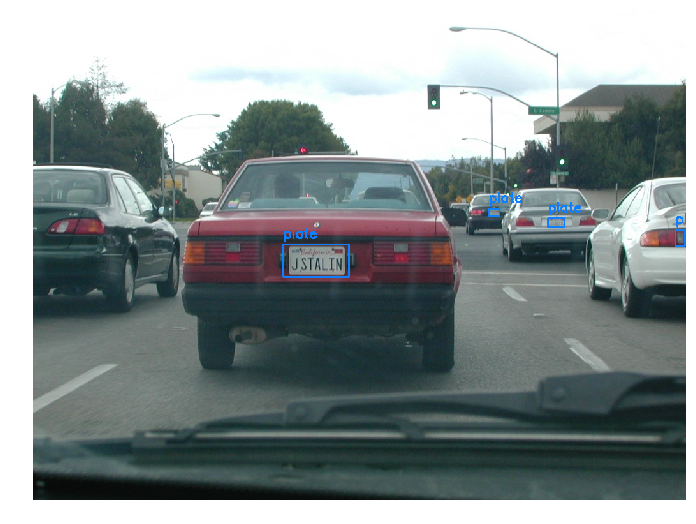

{'boxes': tensor([[ 392.3909,  367.3586,  495.9544,  418.4769],
         [ 807.1377,  326.1082,  833.1053,  340.0065],
         [ 714.3303,  311.7339,  731.1241,  322.2440],
         [1007.7463,  344.2155, 1022.3396,  369.8108],
         [ 828.8741,  324.7157,  845.5852,  339.1801],
         [ 372.7184,  356.9148,  531.8630,  429.3604],
         [ 976.4975,  343.1823, 1013.9147,  371.5865],
         [ 795.1840,  324.6594,  810.1271,  339.5083],
         [ 808.1210,  373.1906,  841.1854,  382.0012],
         [ 710.3732,  307.7471,  728.9700,  326.4406],
         [ 712.9509,  308.6967,  730.1945,  317.5848],
         [ 701.3401,  311.6055,  715.7444,  322.2863],
         [ 694.4504,  311.0659,  728.0646,  327.1276],
         [ 812.4683,  324.3806,  842.4780,  341.7481],
         [ 717.8008,  314.5959,  731.7137,  324.5883]]),
 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 'scores': tensor([0.9927, 0.9601, 0.7052, 0.6563, 0.3027, 0.2682, 0.1984, 0.1267, 0.1093,
       

In [44]:
filename = np.random.choice(val_filenames)
visualize_prediction_plate(filename, model, id_to_name={1: 'plate'}, thresh=0.5, device='cpu')

# Полезные ссылки

На следующем занятии вы поговорите про сегментацию. Модели для детекции могут быть дообучены для сегментации.
Пример: https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html#

## Репозиторий с детектором от Facebook AI Research:
https://github.com/facebookresearch/detectron2